Today we will start by loading all of the modules that we will need for our
analysis. These should all be available by default in Colab and therefore
should not need any extra installation.



In [57]:
import pandas as pd
import numpy as np
from plotnine import *
from PIL import Image
import matplotlib.pyplot as plt

from sklearn.linear_model import ElasticNetCV, LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score, ConfusionMatrixDisplay

ubase = "https://raw.githubusercontent.com/distant-viewing/hdpy/refs/heads/main/"
theme_set(theme_minimal())



## 1. Task 1: Keylogs, Predict Duration

Before we get to images, let's see an example of predictive models for the
keylogs dataset. We will investigate two different tasks. To start, load all
of the keylogging data into Python:



In [58]:
klog = pd.read_csv(ubase + "data/keylog_class.csv.bz2")
klog

,id,task,time,type,key,key_code,alt_key,ctrl_key,meta_key,shift_key,is_repeat,range_start,range_end
0,1,copy,308.7,mouse,NaN,NaN,False,False,False,False,False,971,248
1,1,copy,867.8,mouse,NaN,NaN,False,False,False,False,False,503,282
2,1,copy,22122.3,mouse,NaN,NaN,False,False,False,False,False,526,186
3,1,copy,22376.4,mouse,NaN,NaN,False,False,False,False,False,520,274
4,1,copy,22640.5,mouse,NaN,NaN,False,False,False,False,False,531,304
...,...,...,...,...,...,...,...,...,...,...,...,...,...
110095,48,write,287255.3,mouse,NaN,NaN,False,False,False,False,False,597,595
110096,48,write,287546.7,mouse,NaN,NaN,False,False,False,False,False,580,610
110097,48,write,287802.4,mouse,NaN,NaN,False,False,False,False,False,677,706
110098,48,write,288286.9,mouse,NaN,NaN,False,False,False,False,False,631,583




As we did last time, we need to conver this dataset into a new form that has each letter
typed as a unit of observation.



In [59]:
letters = (
    klog
    .query('type == "down" or type == "up"')
    .sort_values(["id", "time", "key_code"])
    .assign(
        time_up = lambda d: d.groupby("key_code")["time"].shift(-1),
    )
    .query('type == "down"')
    .dropna()
    .drop(columns=["type", "alt_key", "ctrl_key", "is_repeat"])
    .assign(
        duration = lambda d: d["time_up"] - d["time"]
    )
    .assign(
        gap = lambda d: d.groupby("id")["time"].shift(-1) - d["time"]
    ).assign(
        gap_last = lambda d: d.groupby("id")["gap"].shift(1)
    )
    .query("key.str.len() == 1", engine="python")
    .query("0 < duration < 1000")
    .query("0 < gap < 1000")
    .dropna()
)
letters

,id,task,time,key,key_code,meta_key,shift_key,range_start,range_end,time_up,duration,gap,gap_last
11,1,copy,46336.5,F,KeyF,False,True,0,0,46472.2,135.7,300.5,272.1
15,1,copy,46637.0,a,KeyA,False,False,1,1,46749.9,112.9,269.9,300.5
18,1,copy,46906.9,r,KeyR,False,False,2,2,47027.1,120.2,100.2,269.9
20,1,copy,47007.1,,Space,False,False,3,3,47131.6,124.5,139.9,100.2
26,1,copy,47223.2,,Space,False,False,3,3,47351.6,128.4,173.2,76.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
110074,48,write,284983.7,r,KeyR,False,False,294,294,285076.6,92.9,161.5,241.2
110077,48,write,285145.2,e,KeyE,False,False,295,295,285205.9,60.7,101.5,161.5
110080,48,write,285246.7,e,KeyE,False,False,296,296,285334.2,87.5,167.0,101.5
110083,48,write,285413.7,s,KeyS,False,False,297,297,285487.6,73.9,82.2,167.0




Now, lets try to predict how long someone will hold down a key based on the
gap between the following and the next key:



In [60]:
X = letters[["gap", "gap_last"]]
y = letters["duration"]



Now, fit the model:



In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

model = ElasticNetCV()
model.fit(X_train, y_train)

ElasticNetCV()



And then see how well it does in the prediction task:



In [62]:
y_pred_enet = model.predict(X_test)
mean_squared_error(y_test, y_pred_enet)

944.3435382412347



Notice that it is hard to grasp whether this is a good or a bad value.
Maybe a plot would help:



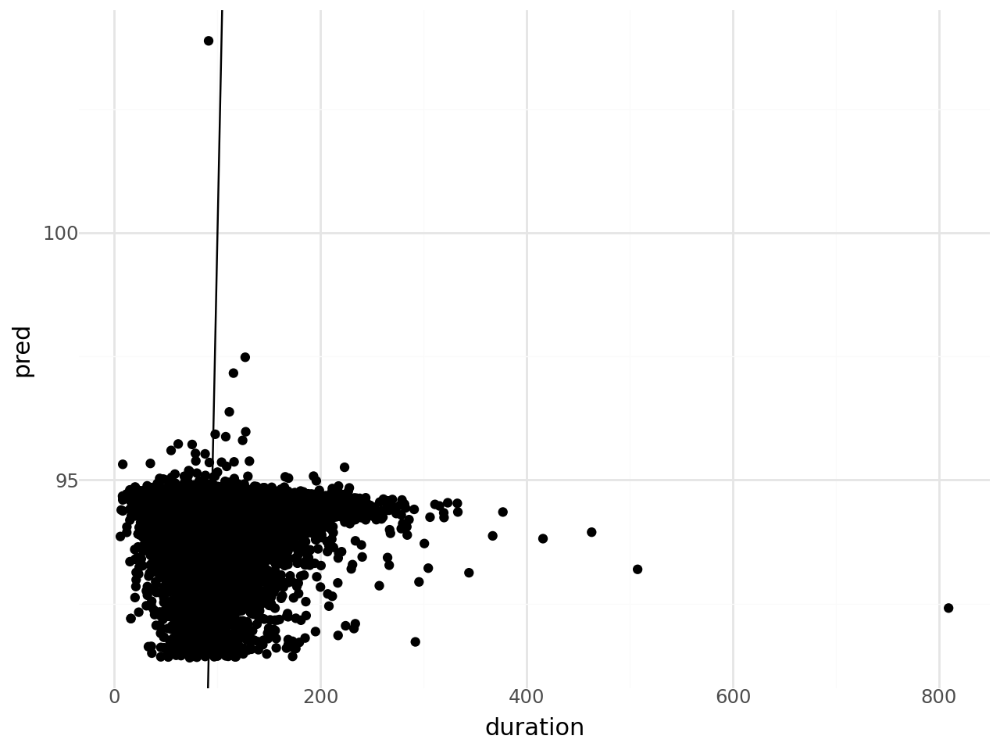

In [63]:
letters["pred"] = model.predict(X)
(
    ggplot(letters, aes("duration", "pred"))
    + geom_point()
    + geom_abline()
)



Would you say that we are able to predict the duration well?

We can extend this code to the case where we want to predict which
task is being performed based on the duration and the two gaps. Here
is the code:



In [64]:
X = letters[["duration", "gap_last", "gap"]]
y = letters["task"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
model = LogisticRegressionCV()
model.fit(X_train, y_train)

y_pred_lreg = model.predict(X_test)
1 - accuracy_score(y_test, y_pred_lreg)

0.4431729518855657



Is this a good rate? Let's confirm with a confusion matrix:



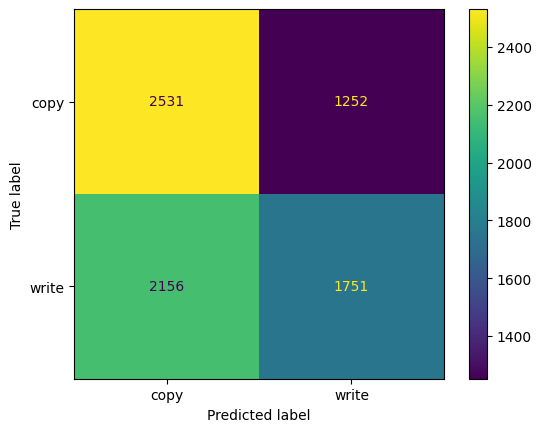

In [65]:
ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred_lreg,
    display_labels=model.classes_
)



You will likely see that we can do a little bit better than random guessing, but
not by much.

If you are curious, here are the parameters that the model selected for the coefficents
of the three variables.



In [66]:
model.coef_

array([[0.00160926, 0.0004006 , 0.00131678]])



Notice that because of the different scales, it is hard to figure out which one is the
best predictor.

## 2. Class Image Dataset

Next, let's work with the class image dataset. To start, we need to donwload the dataset
and unzip all of the images. We can do that with the following line of code:



In [67]:
! wget -nc humanitiesdata.org/images.zip
! unzip images.zip -d .

File ‘images.zip’ already there; not retrieving.

Archive:  images.zip
replace ./images/hand/image-00736.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ./images/hand/image-00736.jpg  
replace ./images/hand/image-00520.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: ./images/hand/image-00520.jpg  
  inflating: ./images/hand/image-00468.jpg  
  inflating: ./images/hand/image-00681.jpg  
  inflating: ./images/hand/image-00680.jpg  
  inflating: ./images/hand/image-00469.jpg  
  inflating: ./images/hand/image-00521.jpg  
  inflating: ./images/hand/image-00938.jpg  
  inflating: ./images/hand/image-00737.jpg  
  inflating: ./images/hand/image-00053.jpg  
  inflating: ./images/hand/image-00735.jpg  
  inflating: ./images/hand/image-01173.jpg  
  inflating: ./images/hand/image-00523.jpg  
  inflating: ./images/hand/image-00682.jpg  
  inflating: ./images/hand/image-00683.jpg  
  inflating: ./images/hand/image-00318.jpg  
  inflating: ./images/hand/image-00522.jpg  
  infl



Next, read the image metadata.



In [68]:
df = pd.read_csv(ubase + "data/image_catalog.csv")
df

,label,path,label2
0,classroom,classroom/image-00032.jpg,classroom
1,classroom,classroom/image-00033.jpg,classroom
2,classroom,classroom/image-00034.jpg,classroom
3,classroom,classroom/image-00035.jpg,classroom
4,classroom,classroom/image-00036.jpg,classroom
...,...,...,...
1214,plant,plant/image-01187.jpg,plant
1215,plant,plant/image-01188.jpg,plant
1216,plant,plant/image-01189.jpg,plant
1217,plant,plant/image-01190.jpg,plant




It will be useful to actually look at some of the images. Run the following code to
have a function that allows us to visualize a set of up to 12 images.



In [69]:
def show_images(paths, labels):
    paths = paths.values; labels = labels.values
    n = min(12, len(paths), len(labels))
    fig, axes = plt.subplots(3, 4, figsize=(12, 9))
    axes = axes.flatten()
    for ax in axes: ax.axis('off')
    for i in range(n):
        axes[i].imshow(Image.open("images/" + paths[i]))
        axes[i].set_title(labels[i])
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()



Here is an example of how to look at twelve random images. Run it a bunch of times
to get a sence for what the data looks like.



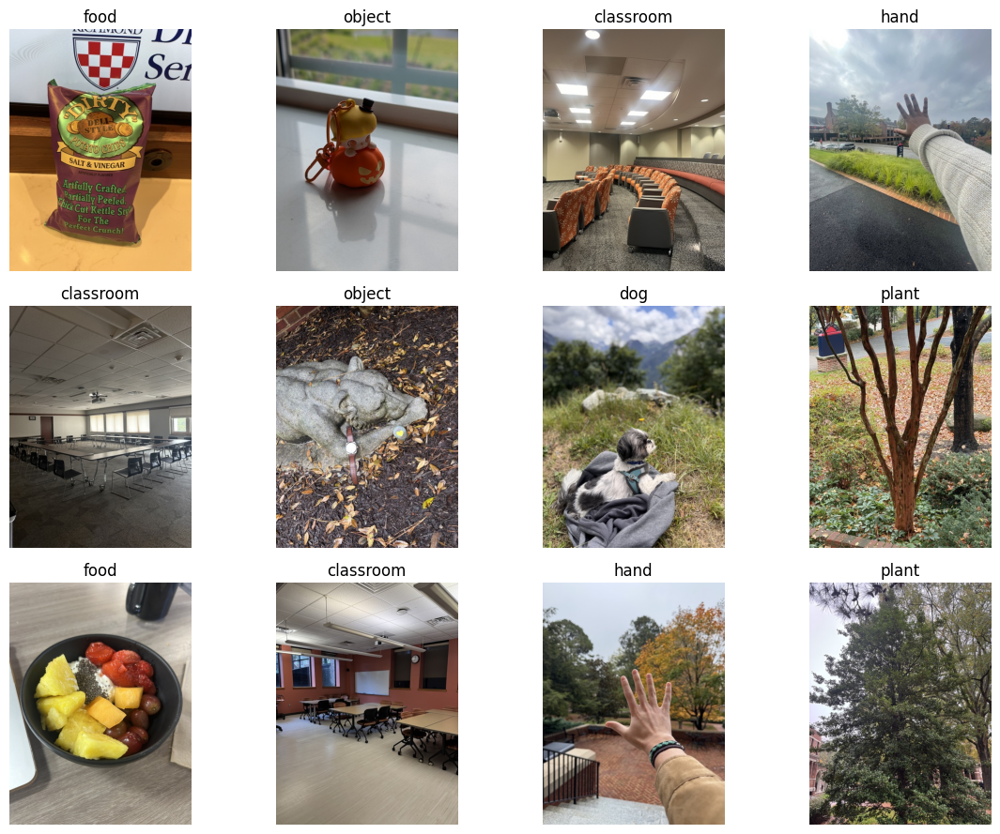

In [87]:
temp = df.sample(n=12)
show_images(temp["path"], temp["label"])



Next, we want to build a predictive model that use the images themselves to predict
the *type* of image. That is, which of the six sets what the image uploaded in to.
But, we can't (easily) but the full iamges into a linear model. We need, instead, to
create numeric summarisations of the images. An easy way to do this is to compute the
average and median brightness of the images. Here is the code that cycles through all
of the images and then creates a new dataset with these columns, which we could then
use for prediction.



In [90]:
avg_values = []
med_values = []

for _, row in df.iterrows():
    img_path = "images/" + row['path']
    img = Image.open(img_path).convert("RGB")
    arr = np.array(img)
    avg_values.append(np.mean(arr))
    med_values.append(np.median(arr))

df_features = pd.DataFrame({
    'avg_pixel_value': avg_values,
    'med_pixel_value': med_values,
    'path': df['path'],
    'label': df['label']
})
df_features

,avg_pixel_value,med_pixel_value,path,label
0,131.802110,142.0,classroom/image-00032.jpg,classroom
1,124.681590,127.0,classroom/image-00033.jpg,classroom
2,118.269402,131.0,classroom/image-00034.jpg,classroom
3,113.112349,123.0,classroom/image-00035.jpg,classroom
4,119.475637,130.0,classroom/image-00036.jpg,classroom
...,...,...,...,...
1214,106.800742,103.0,plant/image-01187.jpg,plant
1215,107.501909,100.0,plant/image-01188.jpg,plant
1216,109.005669,94.0,plant/image-01189.jpg,plant
1217,97.705373,88.0,plant/image-01190.jpg,plant




Before we jump to doing prediction, use the code below to see the darkest
images in the collection. Modify the code to also see the brightest.



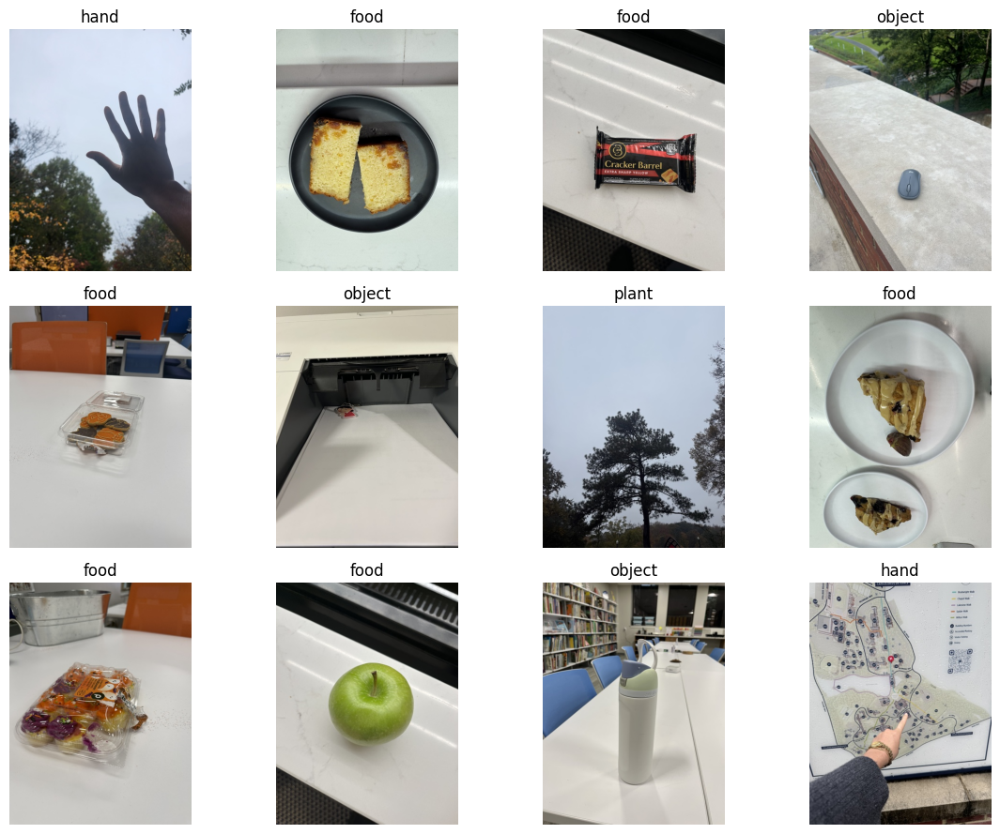

In [91]:
temp = df_features.sort_values("med_pixel_value", ascending=False)
show_images(temp["path"], temp["label"])



Now, let's fit a model on these new columns that we created:



In [73]:
y = df["label"]
X = df_features[["avg_pixel_value", "med_pixel_value"]]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y)

model = LogisticRegressionCV(max_iter=10000)
model.fit(X_train, y_train)

LogisticRegressionCV(max_iter=10000)



Once the model is fit, we can see it's accuracy:



In [74]:
y_pred_lreg = model.predict(X_test)
1 - accuracy_score(y_test, y_pred_lreg)

0.659016393442623



It is not perfect by any means, but it is better than random guessing. Here is
the confusion matrix:



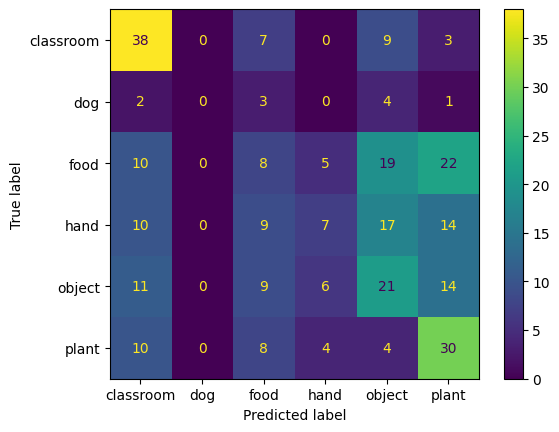

In [75]:
ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred_lreg,
    display_labels=model.classes_
)



What categories is it best and worst at predicting?

We can construct a dataset that has the predicted probabilities of all six
categories:



In [76]:
pred = pd.DataFrame(model.predict_proba(X))
pred.columns = model.classes_
pred['path'] = df_features['path']
pred['label'] = df_features['label']
pred

,classroom,dog,food,hand,object,plant,path,label
0,0.222082,0.053314,0.230283,0.165600,0.271070,0.057652,classroom/image-00032.jpg,classroom
1,0.177428,0.043607,0.237183,0.192401,0.247750,0.101631,classroom/image-00033.jpg,classroom
2,0.408485,0.052768,0.185543,0.108360,0.181823,0.063021,classroom/image-00034.jpg,classroom
3,0.413959,0.048792,0.182469,0.108258,0.165166,0.081355,classroom/image-00035.jpg,classroom
4,0.352924,0.051940,0.200064,0.125061,0.198299,0.071712,classroom/image-00036.jpg,classroom
...,...,...,...,...,...,...,...,...
1214,0.228974,0.035539,0.208615,0.162810,0.167034,0.197029,plant/image-01187.jpg,plant
1215,0.171634,0.031499,0.213099,0.183783,0.170723,0.229261,plant/image-01188.jpg,plant
1216,0.089307,0.023095,0.208479,0.220361,0.167410,0.291348,plant/image-01189.jpg,plant
1217,0.203208,0.027755,0.187676,0.153984,0.130348,0.297028,plant/image-01190.jpg,plant




One thing we can do with this data is to try to understand how the model works
by looking at the images with the highest probability of being each class. Here
are the most "classroomy" images:



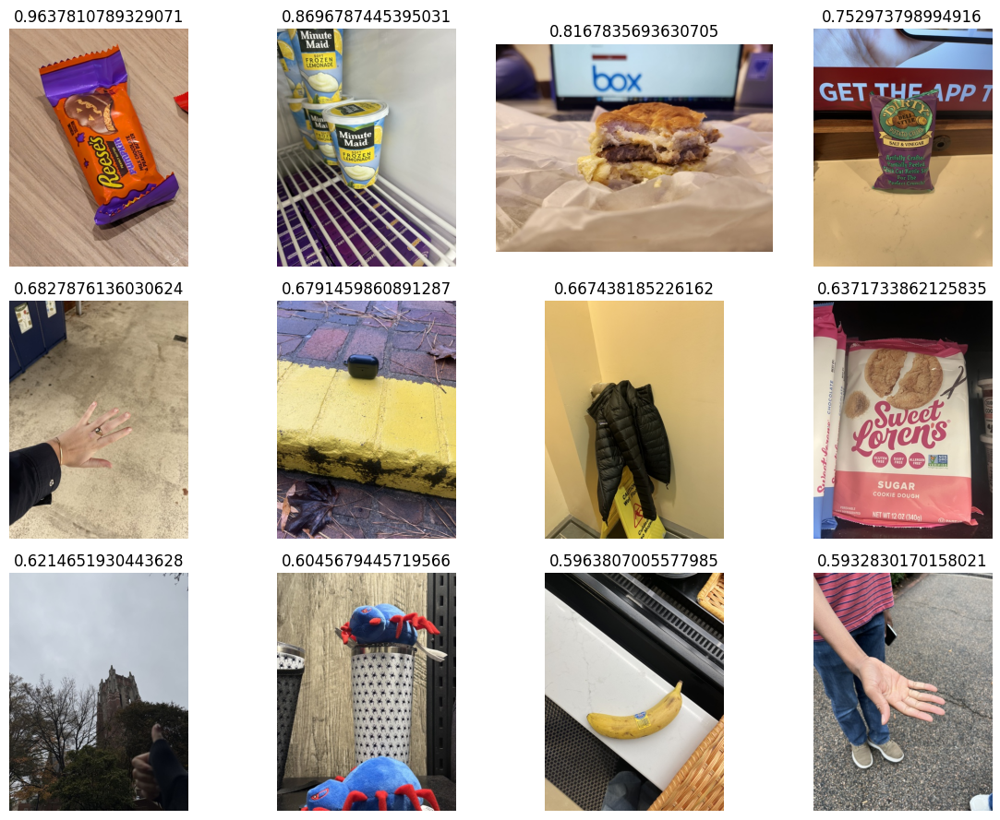

In [92]:
temp = pred.sort_values("food", ascending=False)
show_images(temp["path"], temp["food"])



Look at plant and food as well. Can you get any sense of what the predictor is using
for the categories?

## 3. Images with Color Histograms

We will finish by generating some more complex numeric features from the images. Here
is a function that computes the percentage of different colors in the image:



In [78]:
def compute_color_props(img: Image.Image):
    """
    Returns a dict with:
      - avg_pixel_value
      - proportion_* for red, orange, yellow, green, blue, purple, black, grey, white
    Uses HSV with simple, reasonable cutoffs.
    """
    # Average pixel (over RGB channels)
    arr = np.array(img.convert("RGB"))
    avg_val = arr.mean()

    # Convert to HSV (Pillow HSV ranges: H in [0,255] ~ [0,360), S,V in [0,255])
    hsv = np.array(img.convert("HSV")).astype(np.float32)
    H = hsv[..., 0] * (360.0 / 255.0)
    S = hsv[..., 1] / 255.0
    V = hsv[..., 2] / 255.0

    total = H.size
    if total == 0:
        # fallback to zeros if something odd happens
        zeroes = {
            'avg_pixel_value': avg_val,
            'proportion_red': 0.0, 'proportion_orange': 0.0, 'proportion_yellow': 0.0,
            'proportion_green': 0.0, 'proportion_blue': 0.0, 'proportion_purple': 0.0,
            'proportion_black': 0.0, 'proportion_grey': 0.0, 'proportion_white': 0.0,
        }
        return zeroes

    # --- Cutoffs (tweak if needed) ---
    # Neutral tones:
    #   black: very low value
    #   white: very low saturation and very high value
    #   grey:  low saturation, mid value
    black_v = 0.20
    white_s = 0.10
    white_v = 0.90
    grey_s  = 0.10
    grey_v_low, grey_v_high = 0.20, 0.90

    # For "colorful" pixels, require at least this S and V
    color_s_min = 0.20
    color_v_min = 0.20

    # Hue bands (degrees) for colors:
    # red wraps around 0°
    red_lo2, red_hi2 = 345.0, 360.0
    red_lo1, red_hi1 = 0.0, 15.0
    orange_lo, orange_hi = 15.0, 45.0
    yellow_lo, yellow_hi = 45.0, 70.0
    green_lo, green_hi = 70.0, 170.0
    blue_lo,  blue_hi  = 170.0, 255.0
    purple_lo, purple_hi = 255.0, 345.0

    # --- Masks ---
    mask_black = V < black_v
    mask_white = (S < white_s) & (V >= white_v)
    mask_grey  = (S < grey_s) & (V >= grey_v_low) & (V < grey_v_high)

    mask_color_eligible = (S >= color_s_min) & (V >= color_v_min)

    mask_red = mask_color_eligible & ( ((H >= red_lo2) & (H < red_hi2)) | ((H >= red_lo1) & (H < red_hi1)) )
    mask_orange = mask_color_eligible & (H >= orange_lo) & (H < orange_hi)
    mask_yellow = mask_color_eligible & (H >= yellow_lo) & (H < yellow_hi)
    mask_green  = mask_color_eligible & (H >= green_lo) & (H < green_hi)
    mask_blue   = mask_color_eligible & (H >= blue_lo) & (H < blue_hi)
    mask_purple = mask_color_eligible & (H >= purple_lo) & (H < purple_hi)

    # Counts
    c_black  = np.count_nonzero(mask_black)
    c_white  = np.count_nonzero(mask_white)
    c_grey   = np.count_nonzero(mask_grey)
    c_red    = np.count_nonzero(mask_red)
    c_orange = np.count_nonzero(mask_orange)
    c_yellow = np.count_nonzero(mask_yellow)
    c_green  = np.count_nonzero(mask_green)
    c_blue   = np.count_nonzero(mask_blue)
    c_purple = np.count_nonzero(mask_purple)

    # Proportions
    props = {
        'avg_pixel_value': avg_val,
        'proportion_red':    c_red    / total,
        'proportion_orange': c_orange / total,
        'proportion_yellow': c_yellow / total,
        'proportion_green':  c_green  / total,
        'proportion_blue':   c_blue   / total,
        'proportion_purple': c_purple / total,
        'proportion_black':  c_black  / total,
        'proportion_grey':   c_grey   / total,
        'proportion_white':  c_white  / total,
    }
    return props



We will apply it here, similarly to what we did before:



In [79]:
feature_rows = []

for _, row in df.iterrows():
    img_path = "images/" + row['path']
    img = Image.open(img_path).convert("RGB")
    features = compute_color_props(img)
    feature_rows.append(features)


df_features = pd.DataFrame(feature_rows, index=df.index)
df_features['path'] = df['path']
df_features['label'] = df['label']
df_features

,avg_pixel_value,proportion_red,proportion_orange,proportion_yellow,proportion_green,proportion_blue,proportion_purple,proportion_black,proportion_grey,proportion_white,path,label
0,131.802110,0.000066,0.064270,0.001038,0.000000,0.077042,0.000015,0.115280,0.187739,0.012817,classroom/image-00032.jpg,classroom
1,124.681590,0.002101,0.095606,0.004476,0.000621,0.028091,0.000361,0.079717,0.480779,0.018911,classroom/image-00033.jpg,classroom
2,118.269402,0.024765,0.174779,0.002736,0.002090,0.005656,0.002162,0.176066,0.464676,0.037064,classroom/image-00034.jpg,classroom
3,113.112349,0.140396,0.253906,0.000010,0.000000,0.000743,0.000249,0.121999,0.234400,0.022532,classroom/image-00035.jpg,classroom
4,119.475637,0.000300,0.041911,0.000651,0.000300,0.000270,0.000005,0.118713,0.584442,0.022873,classroom/image-00036.jpg,classroom
...,...,...,...,...,...,...,...,...,...,...,...,...
1214,106.800742,0.052831,0.124557,0.007136,0.185760,0.110814,0.037964,0.092183,0.079783,0.002213,plant/image-01187.jpg,plant
1215,107.501909,0.171951,0.167521,0.087067,0.066004,0.016215,0.043696,0.065506,0.099533,0.007731,plant/image-01188.jpg,plant
1216,109.005669,0.002243,0.201828,0.118546,0.022222,0.009394,0.000015,0.052439,0.347214,0.065165,plant/image-01189.jpg,plant
1217,97.705373,0.102814,0.151967,0.135773,0.036494,0.001790,0.000224,0.115438,0.234802,0.016449,plant/image-01190.jpg,plant




Go through the colors and see what the most red, orange, etc. images are in the
corpus.



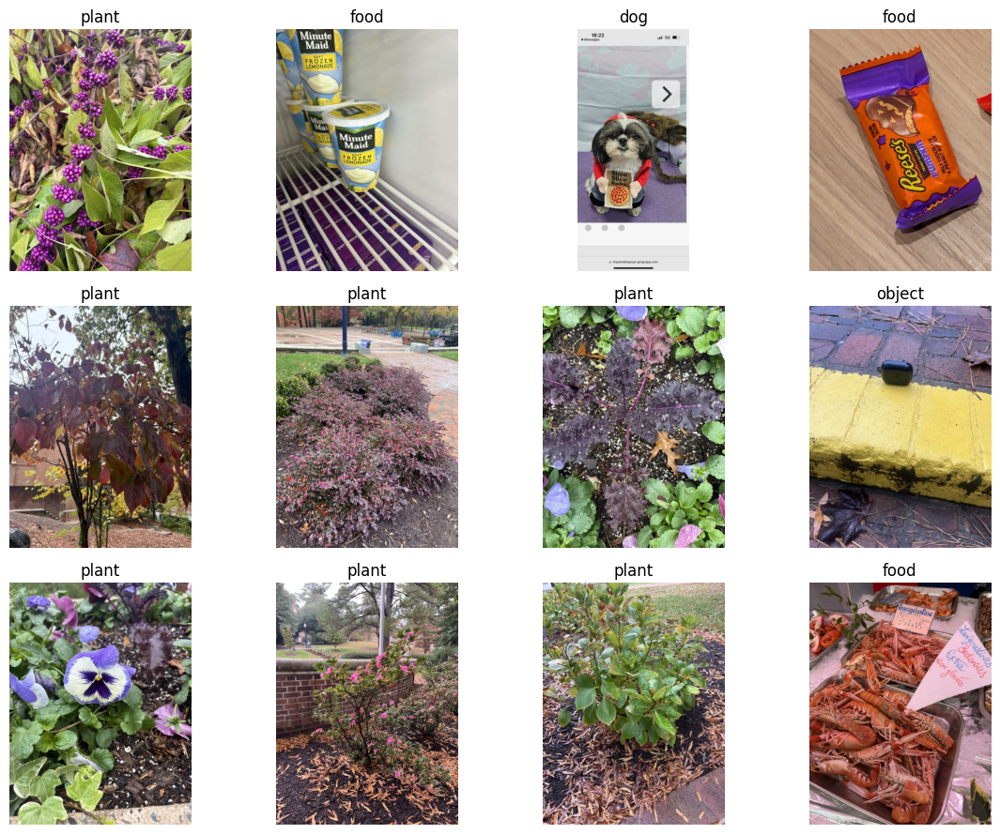

In [80]:
temp = df_features.sort_values("proportion_purple", ascending=False)
show_images(temp["path"], temp["label"])



Now, let's use these to build a model:



In [81]:
y = df["label"]
X = df_features.iloc[:,:10]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y)

model = LogisticRegressionCV(max_iter=10000)
model.fit(X_train, y_train)

y_pred_lreg = model.predict(X_test)
1 - accuracy_score(y_test, y_pred_lreg)

0.5114754098360657



It still is far from perfect, but it does get a little bit better. The error rate
is actually less convincing than looking at the confusion matrix:



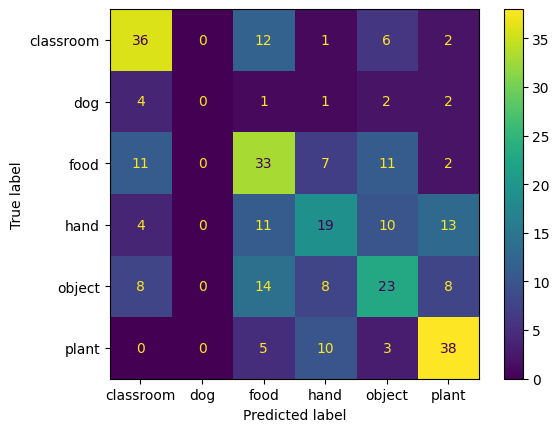

In [82]:
ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred_lreg,
    display_labels=model.classes_
)



Let's re-build the prediction matrix:



In [83]:
pred = pd.DataFrame(model.predict_proba(X))
pred.columns = model.classes_
pred['path'] = df_features['path']
pred['label'] = df_features['label']
pred['pred'] = model.predict(X)
pred

,classroom,dog,food,hand,object,plant,path,label,pred
0,5.519821e-01,0.025467,0.135701,0.040697,0.208400,0.037753,classroom/image-00032.jpg,classroom,classroom
1,4.994439e-01,0.036731,0.149339,0.054587,0.218057,0.041842,classroom/image-00033.jpg,classroom,classroom
2,2.113898e-01,0.039193,0.333084,0.092621,0.280771,0.042941,classroom/image-00034.jpg,classroom,food
3,2.128844e-01,0.067724,0.229846,0.116421,0.257676,0.115448,classroom/image-00035.jpg,classroom,object
4,5.521329e-01,0.035533,0.136191,0.039922,0.193572,0.042650,classroom/image-00036.jpg,classroom,classroom
...,...,...,...,...,...,...,...,...,...
1214,2.281958e-08,0.004176,0.113048,0.023405,0.123261,0.736111,plant/image-01187.jpg,plant,plant
1215,6.941881e-05,0.011817,0.133815,0.037529,0.079398,0.737372,plant/image-01188.jpg,plant,plant
1216,7.213445e-02,0.026875,0.092076,0.233921,0.202440,0.372554,plant/image-01189.jpg,plant,plant
1217,8.026975e-03,0.048064,0.110272,0.158500,0.171702,0.503435,plant/image-01190.jpg,plant,plant




Now, lets the task we did last time. What are the most "planty" images?
What is the way the model is trying to identify Roux?



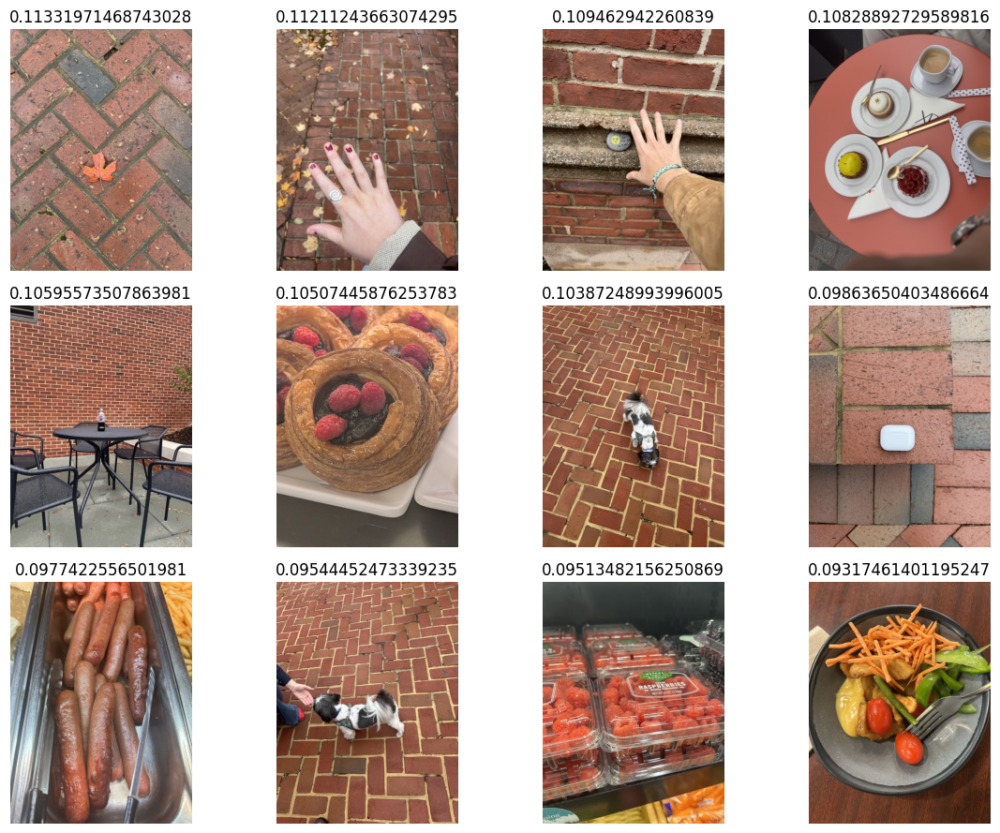

In [84]:
temp = pred.sort_values("dog", ascending=False)
show_images(temp["path"], temp["dog"])



Finally, it can be useful to look at the highest scores that are *wrong*.
Take a look at the wrong plant predictions:



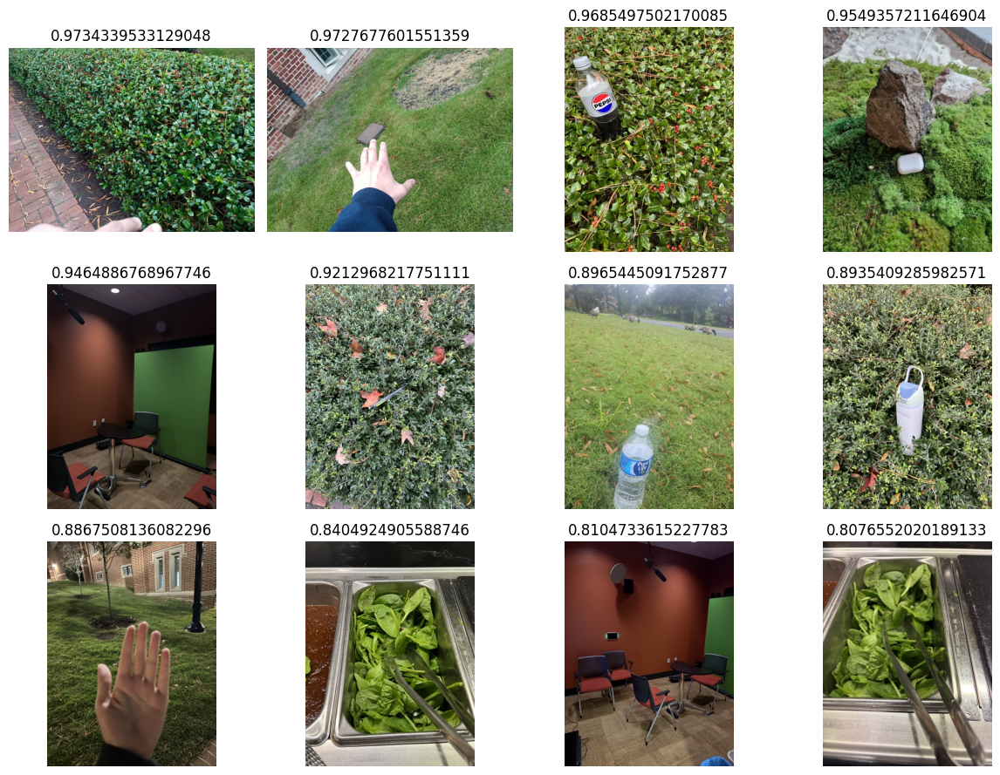

In [85]:
temp = pred.query("label != pred").sort_values("plant", ascending=False)
show_images(temp["path"], temp["plant"])



What's going on here?